In [61]:
import cv2
from cv2.gapi import mask
import numpy as np
import pathlib
import matplotlib.pyplot as plt

class ProcesamientoImagen:
    def __init__(self, imagen, titulo="Imagen", es_color=False):
        self.es_color = es_color
        if isinstance(imagen, (str, pathlib.Path)):
            if es_color:
                tensor_bgr = cv2.imread(str(imagen), cv2.IMREAD_COLOR)
                self.tensor = cv2.cvtColor(tensor_bgr, cv2.COLOR_BGR2RGB)
            else:
                self.tensor = cv2.imread(str(imagen), cv2.IMREAD_GRAYSCALE)
                
            if self.tensor is None:
                raise ValueError(f"Error: No se pudo cargar la imagen en la ruta {imagen}")
        else:
            self.tensor = imagen
            
        self.titulo = titulo

    def to_negative(self) -> "ProcesamientoImagen":
        """Aplica el negativo usando operaciones bit a bit de OpenCV."""
        tensor_neg = cv2.bitwise_not(self.tensor)
        return ProcesamientoImagen(tensor_neg, titulo=f"Negativo de {self.titulo}", es_color=self.es_color)

    def gamma_transform(self, gamma: float) -> "ProcesamientoImagen":
        """Aplica transformación Gamma usando una Look-Up Table (LUT)."""
        table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
        tensor_gamma = cv2.LUT(self.tensor, table)
        return ProcesamientoImagen(tensor_gamma, titulo=f"Gamma (g={gamma})", es_color=self.es_color)

    def binarize(self, umbral: int = 127) -> "ProcesamientoImagen":
        """Binarizado global clásico."""
        _, tensor_bin = cv2.threshold(self.tensor, umbral, 255, cv2.THRESH_BINARY)
        return ProcesamientoImagen(tensor_bin, titulo=f"Binario (th={umbral})", es_color=self.es_color)

    def interpolar(self, r, s) -> "ProcesamientoImagen":
        lut = np.interp(np.arange(256), r, s).astype("uint8")
        tensor_interp = cv2.LUT(self.tensor, lut)
        return ProcesamientoImagen(tensor_interp, titulo=f"Interpolado de {self.titulo}", es_color=self.es_color)
    
    def show_funcion_interpolada(self, r, s, color='blue'):
        x = np.arange(256)
        y = np.interp(x, r, s)
        plt.figure(figsize=(4, 4))
        plt.plot(x, y, color=color, linewidth=2)
        plt.title("Función de Interpolación")
        plt.xlabel("Intensidad Original (r)")
        plt.ylabel("Intensidad Transformada (s)")
        plt.xlim(0, 256)
        plt.ylim(0, 256)
        plt.grid()
        plt.show()

    def pseudocolor(self, tr_r, ts_r, tr_g, ts_g, tr_b, ts_b) -> "ProcesamientoImagen":
        if self.es_color:
            raise ValueError("pseudocolor solo aplica a imágenes en escala de grises.")
        lut_r = np.interp(np.arange(256), tr_r, ts_r).astype("uint8")
        lut_g = np.interp(np.arange(256), tr_g, ts_g).astype("uint8")
        lut_b = np.interp(np.arange(256), tr_b, ts_b).astype("uint8")
        canal_r = cv2.LUT(self.tensor, lut_r)
        canal_g = cv2.LUT(self.tensor, lut_g)
        canal_b = cv2.LUT(self.tensor, lut_b)
        tensor_color = cv2.merge((canal_r, canal_g, canal_b))
        return ProcesamientoImagen(tensor_color, titulo=f"Pseudocolor de {self.titulo}", es_color=True)

    def ecualizar(self) -> "ProcesamientoImagen":
        if not self.es_color:
            tensor_eq = cv2.equalizeHist(self.tensor)
        else:
            hsv = cv2.cvtColor(self.tensor, cv2.COLOR_RGB2HSV)
            h, s, v = cv2.split(hsv)
            v_eq = cv2.equalizeHist(v)
            hsv_eq = cv2.merge((h, s, v_eq))
            tensor_eq = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2RGB)
        return ProcesamientoImagen(tensor_eq, titulo=f"Ecualizado de {self.titulo}", es_color=self.es_color)

    def show(self):
        cv2.imshow(self.titulo, self.tensor)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
        return self

    def show_jupyter(self, figsize_gray=(10, 4), figsize_color=(12, 8), histograma=True) -> "ProcesamientoImagen":
        if not histograma:
            fig, ax = plt.subplots(figsize=(figsize_color[0] // 2, figsize_color[1] // 2) if self.es_color else (figsize_gray[0] // 2, figsize_gray[1]))
            ax.imshow(self.tensor, cmap=None if self.es_color else 'gray')
            ax.set_title(self.titulo)
            ax.axis('off')
            plt.tight_layout()
            plt.show()
            return self

        if self.es_color:
            fig, ((ax_img, ax_hist_r), (ax_hist_g, ax_hist_b)) = plt.subplots(2, 2, figsize=figsize_color)
            ax_img.imshow(self.tensor)
            ax_img.set_title(self.titulo)
            ax_img.axis('off')
            colores = [('Rojo', 'red', ax_hist_r), ('Verde', 'green', ax_hist_g), ('Azul', 'blue', ax_hist_b)]
            for i, (nombre, color_plot, ax) in enumerate(colores):
                hist = cv2.calcHist([self.tensor], [i], None, [256], [0, 256])
                ax.plot(hist, color=color_plot, linewidth=1.5)
                ax.fill_between(range(256), hist.flatten(), color=color_plot, alpha=0.1)
                ax.set_title(f"Canal {nombre}")
                ax.set_xlim([0, 256])
        else:
            fig, (ax_img, ax_hist) = plt.subplots(1, 2, figsize=figsize_gray)
            ax_img.imshow(self.tensor, cmap='gray')
            ax_img.set_title(self.titulo)
            ax_img.axis('off')
            n, _, _ = ax_hist.hist(self.tensor.ravel(), bins=256, range=(0, 256), color='gray')
            ax_hist.fill_between(range(256), n, color='red', alpha=0.4)
            ax_hist.set_title("Histograma Grises")
            ax_hist.set_xlim([0, 256])
        plt.tight_layout()
        plt.show()
        return self
    
    def log_transform(self) -> "ProcesamientoImagen":
        c = 255 / np.log1p(255)
        lut = (c * np.log1p(np.arange(256))).astype("uint8")
        tensor_log = cv2.LUT(self.tensor, lut)
        return ProcesamientoImagen(tensor_log, titulo=f"Log de {self.titulo}", es_color=self.es_color)

    def agregar_ruido_uniforme(self, minimo: float = -20, maximo: float = 20, semilla: int = None) -> "ProcesamientoImagen":
        if minimo > maximo:
            raise ValueError("minimo no puede ser mayor que maximo")
        rng = np.random.default_rng(semilla)
        ruido = rng.uniform(minimo, maximo, size=self.tensor.shape)
        tensor_ruido = np.clip(self.tensor.astype(np.float32) + ruido, 0, 255).astype(np.uint8)
        return ProcesamientoImagen(tensor_ruido, titulo=f"Ruido uniforme [{minimo}, {maximo}] de {self.titulo}", es_color=self.es_color)
    
    def ruido_porcentaje(self, porcentaje: float, semilla: int = None) -> "ProcesamientoImagen":
        S = self.tensor.copy()
        for i in range(int(S.shape[0] * S.shape[1] * porcentaje)):
            x = np.random.randint(S.shape[1]-1)
            y = np.random.randint(S.shape[0]-1)
            S[y, x] = np.random.randint(255)
        return ProcesamientoImagen(S, titulo=f"Ruido porcentaje {porcentaje} de {self.titulo}", es_color=self.es_color)

    def sal_pimienta(self, valor, cnt) -> "ProcesamientoImagen":
        S = self.tensor.copy()
        for n in range(cnt):
            i = np.random.randint(self.tensor.shape[0] - 1)
            j = np.random.randint(self.tensor.shape[1] - 1)
            S[i, j] = valor
        return ProcesamientoImagen(S, titulo=f"Sal y pimienta de {self.titulo}", es_color=self.es_color)

    def trace(self) -> "ProcesamientoImagen":
        if self.es_color:
            tensor_display = cv2.cvtColor(self.tensor, cv2.COLOR_RGB2BGR)
        else:
            tensor_display = self.tensor.copy()
        
        def mouse_callback(event, x, y, flags, param):
            if event == cv2.EVENT_MOUSEMOVE:
                img_temp = tensor_display.copy()
                intensidad = self.tensor[y, x]
                texto = f"RGB: {intensidad}" if self.es_color else f"Intensidad: {intensidad}"
                cv2.rectangle(img_temp, (5, 5), (400, 40), (0, 0, 0), -1)
                cv2.putText(img_temp, texto, (15, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
                cv2.imshow(self.titulo, img_temp)

        cv2.namedWindow(self.titulo)
        cv2.setMouseCallback(self.titulo, mouse_callback)
        cv2.imshow(self.titulo, self.tensor)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
        return self
    
    def ecualizado(self) -> "ProcesamientoImagen":
        if self.es_color:
            r, g, b = cv2.split(self.tensor)
            tensor_eq = cv2.merge((cv2.equalizeHist(r), cv2.equalizeHist(g), cv2.equalizeHist(b)))
        else:
            tensor_eq = cv2.equalizeHist(self.tensor)
        return ProcesamientoImagen(tensor_eq, titulo=f"Ecualizado RGB separado de {self.titulo}", es_color=self.es_color)
    
    def save(self, ruta: str):
        if self.es_color:
            cv2.imwrite(ruta, cv2.cvtColor(self.tensor, cv2.COLOR_RGB2BGR))
        else:
            cv2.imwrite(ruta, self.tensor)

    def show_matriz(self, max_size: int = 16, region: tuple = None) -> "ProcesamientoImagen":
        if region is not None:
            y1, x1, y2, x2 = region
            recorte = self.tensor[y1:y2, x1:x2]
        else:
            recorte = self.tensor[:max_size, :max_size]
        recorte = recorte[:max_size, :max_size]
        np.set_printoptions(linewidth=160)
        print(f"{self.titulo}  [{recorte.shape[0]}x{recorte.shape[1]} px]")
        if self.es_color:
            for nombre, c in zip(['R', 'G', 'B'], range(3)):
                print(f"Canal {nombre}:")
                print(recorte[:, :, c])
        else:
            print(recorte)
        return self

    def fila(self, n: int, derivada: bool = False) -> np.ndarray:
        senal = self.tensor[n, :].astype(np.float32)
        if derivada:
            d = np.gradient(senal)
            xlim = (0, len(senal) - 1)
            ylim = (min(senal.min(), d.min()), max(senal.max(), d.max()))
            fig, axes = plt.subplots(1, 3, figsize=(18, 3))
            axes[0].plot(senal, color='steelblue')
            axes[0].set_title(f"Fila {n}")
            axes[0].set_xlabel("Columna")
            axes[0].set_xlim(xlim)
            axes[0].set_ylim(ylim)
            axes[0].grid()
            axes[1].plot(d, color='orange')
            axes[1].set_title(f"Derivada fila {n}")
            axes[1].set_xlabel("Columna")
            axes[1].set_xlim(xlim)
            axes[1].set_ylim(ylim)
            axes[1].axhline(0, color='gray', linewidth=0.8)
            axes[1].grid()
            axes[2].plot(senal, color='steelblue', label='Señal')
            axes[2].plot(d, color='orange', label='Derivada')
            axes[2].set_title(f"Fila {n} — superpuesta")
            axes[2].set_xlabel("Columna")
            axes[2].set_xlim(xlim)
            axes[2].set_ylim(ylim)
            axes[2].axhline(0, color='gray', linewidth=0.8)
            axes[2].legend()
            axes[2].grid()
            plt.tight_layout()
            plt.show()
        else:
            fig, ax = plt.subplots(figsize=(10, 3))
            ax.plot(senal, color='steelblue')
            ax.set_title(f"Fila {n}")
            ax.set_xlabel("Columna")
            ax.set_xlim(0, len(senal) - 1)
            ax.grid()
            plt.tight_layout()
            plt.show()
        return senal

    def columna(self, n: int, derivada: bool = False) -> np.ndarray:
        senal = self.tensor[:, n].astype(np.float32)
        if derivada:
            d = np.gradient(senal)
            xlim = (0, len(senal) - 1)
            ylim = (min(senal.min(), d.min()), max(senal.max(), d.max()))
            fig, axes = plt.subplots(1, 3, figsize=(18, 3))
            axes[0].plot(senal, color='steelblue')
            axes[0].set_title(f"Columna {n}")
            axes[0].set_xlabel("Fila")
            axes[0].set_xlim(xlim)
            axes[0].set_ylim(ylim)
            axes[0].grid()
            axes[1].plot(d, color='orange')
            axes[1].set_title(f"Derivada columna {n}")
            axes[1].set_xlabel("Fila")
            axes[1].set_xlim(xlim)
            axes[1].set_ylim(ylim)
            axes[1].axhline(0, color='gray', linewidth=0.8)
            axes[1].grid()
            axes[2].plot(senal, color='steelblue', label='Señal')
            axes[2].plot(d, color='orange', label='Derivada')
            axes[2].set_title(f"Columna {n} — superpuesta")
            axes[2].set_xlabel("Fila")
            axes[2].set_xlim(xlim)
            axes[2].set_ylim(ylim)
            axes[2].axhline(0, color='gray', linewidth=0.8)
            axes[2].legend()
            axes[2].grid()
            plt.tight_layout()
            plt.show()
        else:
            fig, ax = plt.subplots(figsize=(10, 3))
            ax.plot(senal, color='steelblue')
            ax.set_title(f"Columna {n}")
            ax.set_xlabel("Fila")
            ax.set_xlim(0, len(senal) - 1)
            ax.grid()
            plt.tight_layout()
            plt.show()
        return senal
    
    def sumar_escalar(self, valor: int) -> "ProcesamientoImagen":
        resultado = np.clip(self.tensor.astype(np.int16) + valor, 0, 255).astype(np.uint8)
        return ProcesamientoImagen(resultado, titulo=f"{self.titulo}+{valor}", es_color=self.es_color)

    def mostrar_bordes(self, kernel: np.ndarray) -> "ProcesamientoImagen":
        img_f = self.tensor.astype(np.float32)
        if self.es_color:
            canales = [cv2.filter2D(img_f[:, :, c], -1, kernel) for c in range(3)]
            resultado = np.abs(np.stack(canales, axis=2))
        else:
            resultado = np.abs(cv2.filter2D(img_f, -1, kernel))
        maximo = resultado.max()
        if maximo > 0:
            resultado = resultado / maximo * 255
        return ProcesamientoImagen(resultado.astype(np.uint8), titulo=f"Bordes de {self.titulo}", es_color=self.es_color)

    def highboost(self, kernel: np.ndarray, factor: float = 3.0) -> "ProcesamientoImagen":
        img_f = self.tensor.astype(np.float32)
        if self.es_color:
            canales = [cv2.filter2D(img_f[:, :, c], -1, kernel) for c in range(3)]
            l_img = np.stack(canales, axis=2)
        else:
            l_img = cv2.filter2D(img_f, -1, kernel)
        resultado = np.clip(img_f - (l_img * factor), 0, 255).astype(np.uint8)
        return ProcesamientoImagen(resultado, titulo=f"Highboost (f={factor}) de {self.titulo}", es_color=self.es_color)

    def filtro_umbral(self, original, filtrada, umbral: int) -> "ProcesamientoImagen":
        mask = np.abs(original.astype(np.int16) - filtrada.astype(np.int16)) > umbral
        S = np.where(mask, filtrada, original).astype(np.uint8)
        return ProcesamientoImagen(S, titulo=f"Umbral de {self.titulo}", es_color=self.es_color)
    
    def filtro_mediana(self, radio) -> "ProcesamientoImagen":
        S = self.tensor.copy()
        for i in range(radio, self.tensor.shape[0] - 1 - radio):
            for j in range(radio, self.tensor.shape[1] - 1 - radio):
                vecinos = self.tensor[i - radio:i + radio + 1, j - radio:j + radio + 1]
                if self.es_color:
                    S[i, j] = [np.median(vecinos[:, :, c]) for c in range(3)]
                else:
                    S[i, j] = np.median(vecinos)
        return ProcesamientoImagen(S, titulo=f"Filtro mediana de {self.titulo}", es_color=self.es_color)
    
    def restar_imagenes(self, img2) -> "ProcesamientoImagen":
        if self.tensor.shape != img2.tensor.shape:
            raise ValueError("Las imágenes deben tener el mismo tamaño para restar.")
        resultado = np.clip(self.tensor.astype(np.int16) - img2.tensor.astype(np.int16), 0, 255).astype(np.uint8)
        return ProcesamientoImagen(resultado, titulo=f"Resta de {self.titulo} y {img2.titulo}", es_color=self.es_color)
    
    def promedio_imagenes(self, number_images: list) -> "ProcesamientoImagen":
        suma = np.zeros_like(self.tensor, dtype=np.float32)
        for img in number_images:
            if self.tensor.shape != img.tensor.shape:
                raise ValueError("Todas las imágenes deben tener el mismo tamaño para promediar.")
            suma += img.tensor.astype(np.float32)
        promedio = np.clip(suma / len(number_images), 0, 255).astype(np.uint8)
        return ProcesamientoImagen(promedio, titulo=f"Promedio de {self.titulo} y {[img.titulo for img in number_images]}", es_color=self.es_color)

    # ─────────────────────────────────────────────
    # Kernels, Convolución y Correlación
    # ─────────────────────────────────────────────

    @staticmethod
    def kernel_promedio(size: int = 3) -> np.ndarray:
        return np.ones((size, size), dtype=np.float32) / (size * size)

    @staticmethod
    def kernel_gaussiano(size: int = 3, sigma: float = 1.0) -> np.ndarray:
        k = cv2.getGaussianKernel(size, sigma)
        return (k @ k.T).astype(np.float32)

    @staticmethod
    def kernel_nitidez() -> np.ndarray:
        return np.array([[ 0, -1,  0],
                         [-1,  5, -1],
                         [ 0, -1,  0]], dtype=np.float32)

    @staticmethod
    def kernel_laplaciano() -> np.ndarray:
        return np.array([[0,  1, 0],
                         [1, -4, 1],
                         [0,  1, 0]], dtype=np.float32)

    @staticmethod
    def kernel_sobel_x() -> np.ndarray:
        return np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]], dtype=np.float32)

    @staticmethod
    def kernel_sobel_y() -> np.ndarray:
        return np.array([[-1, -2, -1],
                         [ 0,  0,  0],
                         [ 1,  2,  1]], dtype=np.float32)

    @staticmethod
    def mostrar_kernel(kernel: np.ndarray, titulo: str = "Kernel"):
        fig, ax = plt.subplots(figsize=(max(3, kernel.shape[1]), max(3, kernel.shape[0])))
        im = ax.imshow(kernel, cmap='RdBu_r', aspect='auto')
        for i in range(kernel.shape[0]):
            for j in range(kernel.shape[1]):
                ax.text(j, i, f"{kernel[i, j]:.3g}", ha='center', va='center',
                        fontsize=10, color='black')
        plt.colorbar(im, ax=ax)
        ax.set_title(titulo)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.tight_layout()
        plt.show()

    def correlacion(self, kernel: np.ndarray) -> "ProcesamientoImagen":
        kernel = kernel.astype(np.float32)
        if self.es_color:
            canales = [cv2.filter2D(self.tensor[:, :, c].astype(np.float32), -1, kernel)
                       for c in range(3)]
            resultado = np.clip(np.stack(canales, axis=2), 0, 255).astype(np.uint8)
        else:
            resultado = np.clip(
                cv2.filter2D(self.tensor.astype(np.float32), -1, kernel), 0, 255
            ).astype(np.uint8)
        return ProcesamientoImagen(resultado, titulo=f"Correlación de {self.titulo}", es_color=self.es_color)

    def convolucion(self, kernel: np.ndarray) -> "ProcesamientoImagen":
        kernel_rotado = np.flip(kernel).astype(np.float32)
        if self.es_color:
            canales = [cv2.filter2D(self.tensor[:, :, c].astype(np.float32), -1, kernel_rotado)
                       for c in range(3)]
            resultado = np.clip(np.stack(canales, axis=2), 0, 255).astype(np.uint8)
        else:
            resultado = np.clip(
                cv2.filter2D(self.tensor.astype(np.float32), -1, kernel_rotado), 0, 255
            ).astype(np.uint8)
        return ProcesamientoImagen(resultado, titulo=f"Convolución de {self.titulo}", es_color=self.es_color)

    def bordes_sobel(self) -> "ProcesamientoImagen":
        if self.es_color:
            raise ValueError("bordes_sobel solo opera en imágenes en escala de grises.")
        img_f = self.tensor.astype(np.float32)
        gx = cv2.filter2D(img_f, -1, self.kernel_sobel_x())
        gy = cv2.filter2D(img_f, -1, self.kernel_sobel_y())
        magnitud = np.sqrt(gx**2 + gy**2)
        magnitud = np.clip(magnitud / magnitud.max() * 255, 0, 255).astype(np.uint8)
        return ProcesamientoImagen(magnitud, titulo=f"Sobel de {self.titulo}", es_color=False)


In [26]:
import pathlib

ruta = pathlib.Path.cwd() / "imagenes"

def cargar_imagen(nombre_archivo):
    return ruta / nombre_archivo

# Ejercicio 1
1.	Aplique el filtrado pasa-bajas varias veces sobre la misma imagen. Explique el resultado límite de aplicar este filtro un número infinito de veces. 

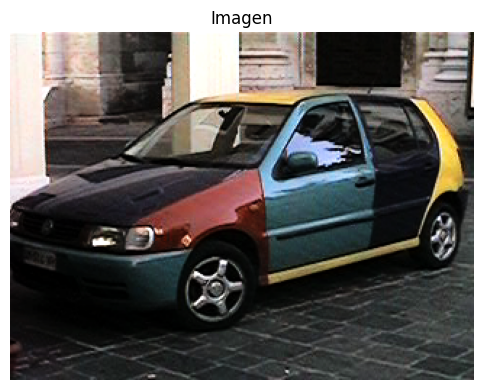

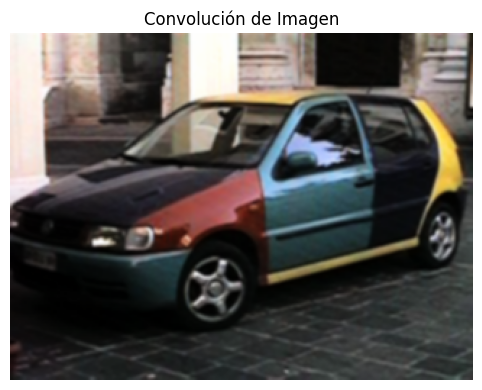

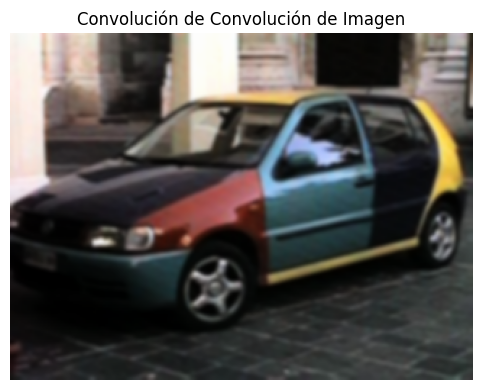

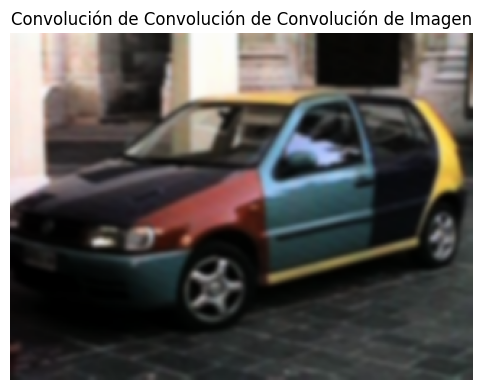

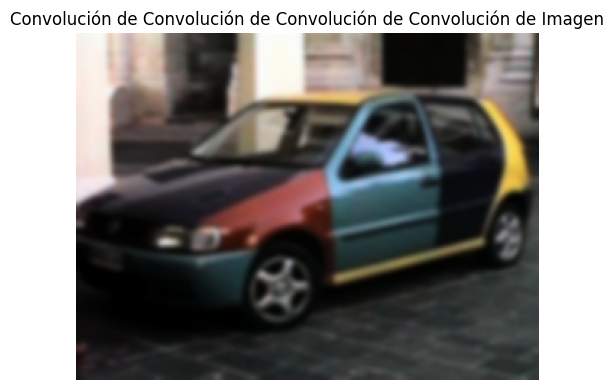

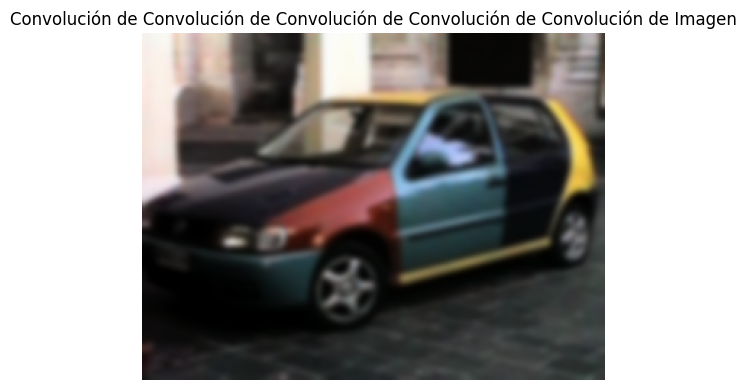

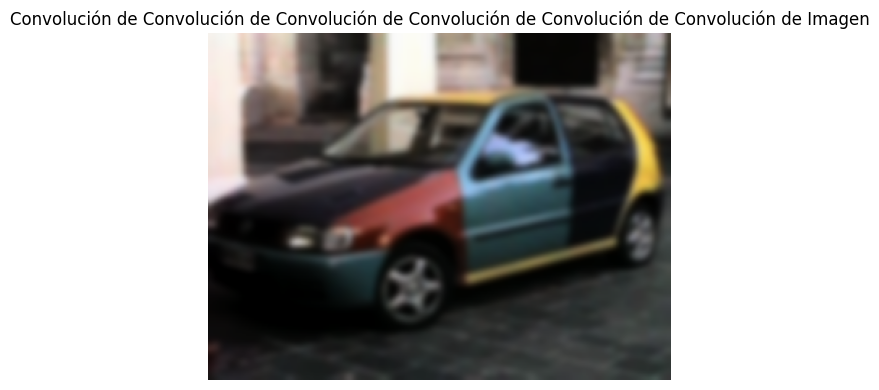

In [27]:
imagen = ProcesamientoImagen(cargar_imagen('golf.bmp'), es_color=True)
imagen.show_jupyter(histograma=False)
imagen2 = imagen.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)
imagen3 = imagen2.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)
imagen4 = imagen3.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)
imagen5 = imagen4.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)
imagen6 = imagen5.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)
imagen7 = imagen6.convolucion(imagen.kernel_gaussiano(size=5, sigma=1.0)).show_jupyter(histograma=False)

# Ejercicio 2
2.	Elimine el ruido presente en las fotografías torre_verona.bmp, florencia.bmp y florencia1.bmp. Describa de forma cualitativa y cuantitativa el tipo de ruido presente en la imagen.  Justifique el filtro utilizado, así como los valores de tamaño de ventana, umbral, etc.

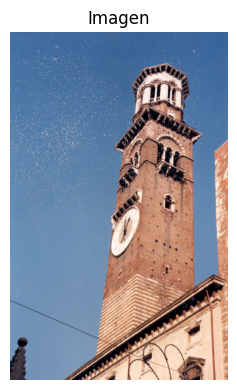

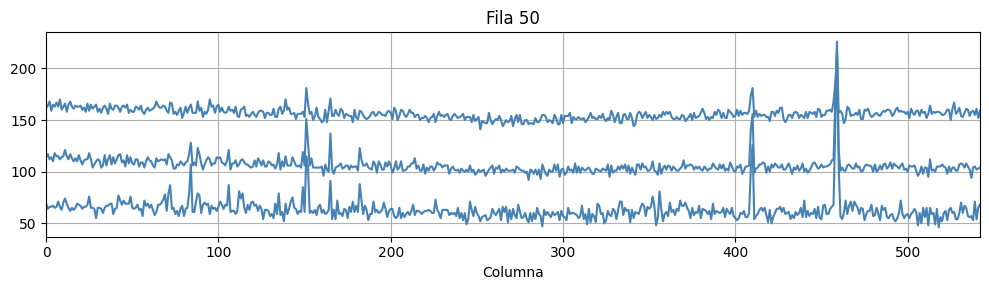

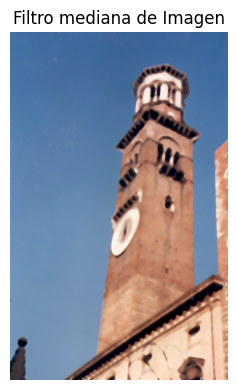

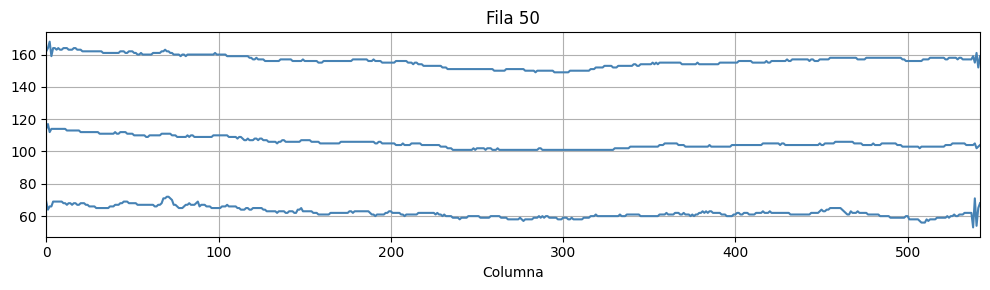

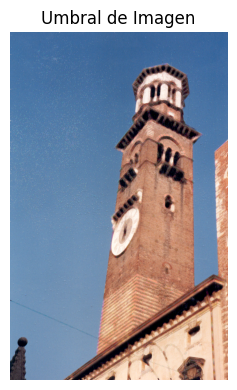

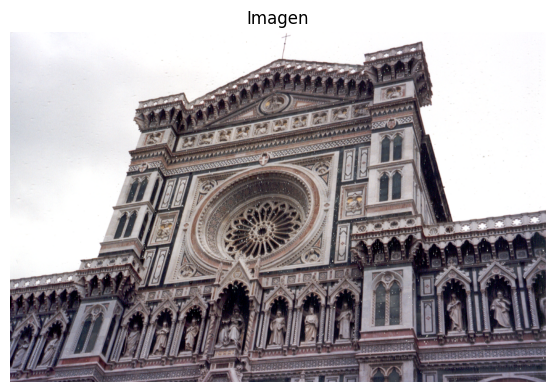

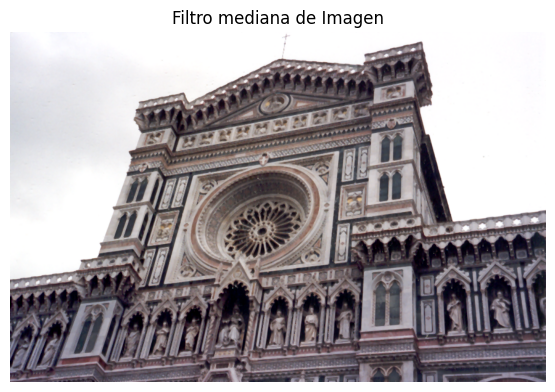

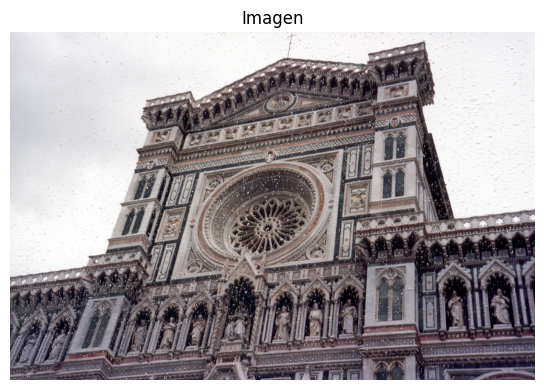

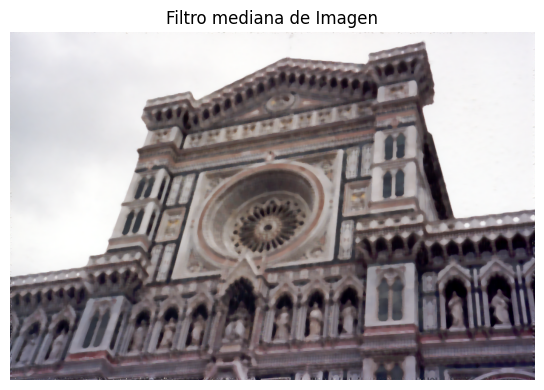

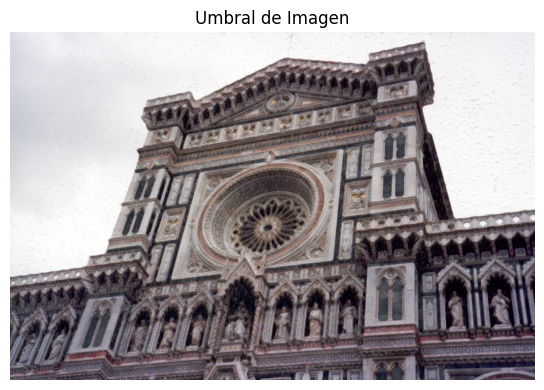

In [28]:
ruta_patrones = pathlib.Path.cwd() / "imagenes" / "ruido"
imagen = ProcesamientoImagen(ruta_patrones / "torre_verona.bmp", es_color=True)
imagen.show_jupyter(histograma=False)
imagen.fila(50)
imagen_filtrada = imagen.filtro_mediana(radio=4)
imagen_filtrada.show_jupyter(histograma=False)
imagen_filtrada.fila(50)
imagen.filtro_umbral(imagen.tensor, imagen_filtrada.tensor, umbral=40).show_jupyter(histograma=False)
imagen2 = ProcesamientoImagen(ruta_patrones / "florencia.bmp", es_color=True)
imagen2.show_jupyter(histograma=False)
imagen2.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen3 = ProcesamientoImagen(ruta_patrones / "florencia2.bmp", es_color=True)
imagen3.show_jupyter(histograma=False)
imagen3_filtrada = imagen3.filtro_mediana(radio=3)
imagen3_filtrada.show_jupyter(histograma=False)
imagen3.filtro_umbral(imagen3.tensor, imagen3_filtrada.tensor, umbral=40).show_jupyter(histograma=False)

# Ejercicio 3
3.	Utilizando un generador de ruido uniforme, pruebe el filtro de mediana con distintos valores de radio y porcentajes de ruido, en tonos de grises y en RGB. En base a sus pruebas ¿es posible establecer una  relación entre porcentaje de ruido y radio de máscara de filtrado? Explique.

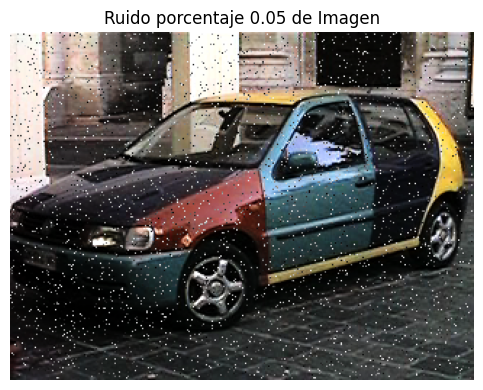

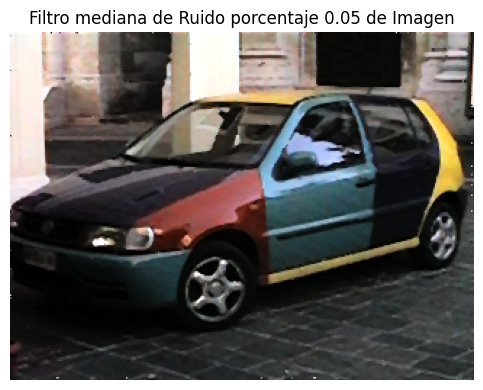

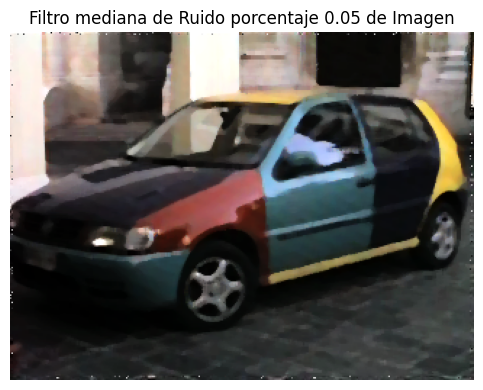

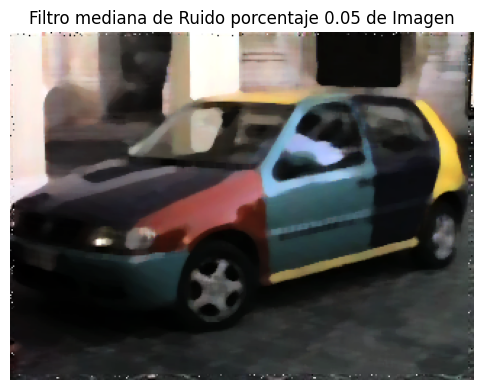

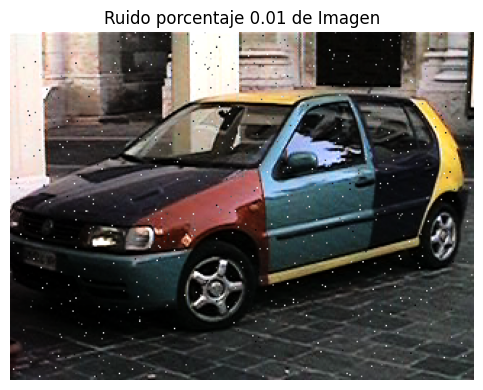

...

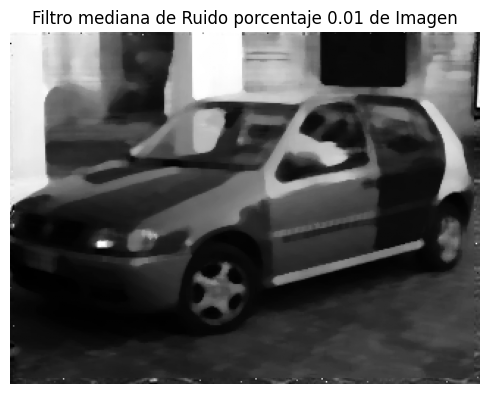

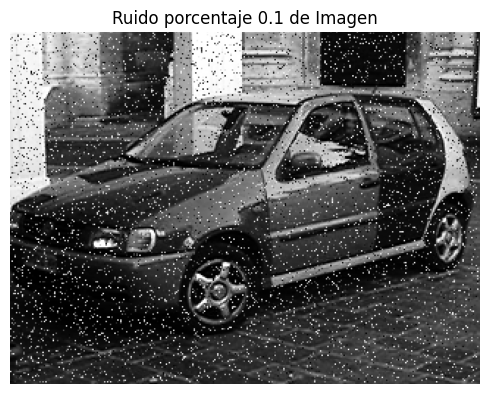

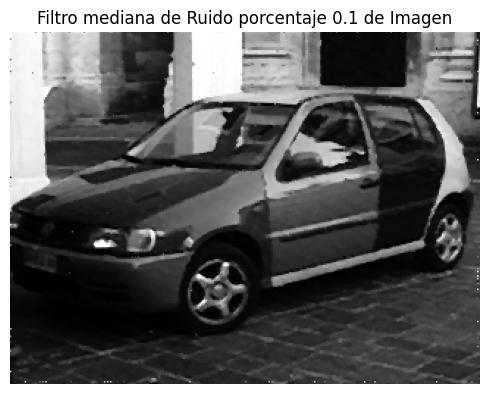

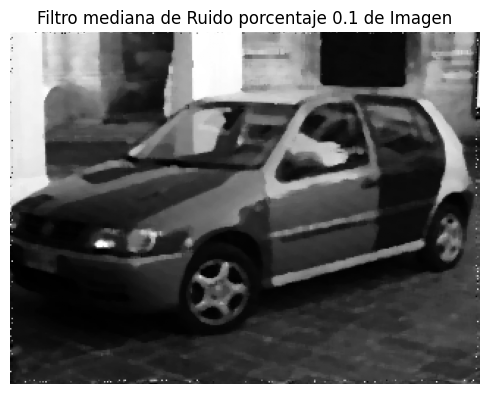

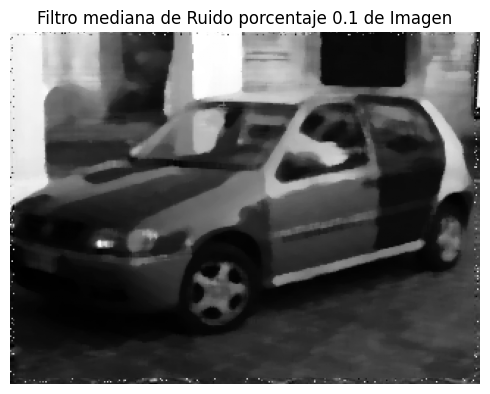

In [31]:
imagen = ProcesamientoImagen(cargar_imagen('golf.bmp'), es_color=True)
imagen_ruido = imagen.ruido_porcentaje(0.05, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)
imagen_ruido = imagen.ruido_porcentaje(0.01, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)
imagen_ruido = imagen.ruido_porcentaje(0.1, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)
imagen = ProcesamientoImagen(cargar_imagen('golf.bmp'), es_color=False)
imagen_ruido = imagen.ruido_porcentaje(0.05, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)
imagen_ruido = imagen.ruido_porcentaje(0.01, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)
imagen_ruido = imagen.ruido_porcentaje(0.1, semilla=42).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=1).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=2).show_jupyter(histograma=False)
imagen_ruido.filtro_mediana(radio=3).show_jupyter(histograma=False)

# Ejercicio 4
4.	Utilizando la técnica  “High-Boost”, en conjunto con los ajustes de contraste y ecualización probados anteriormente, busque un mejor resultado para el tratamiento de la radiografía. Pruebe ajustar primero el contraste seguido del filtrado, así como filtrado primero y terminar con ajuste de contraste. ¿Hay alguna diferencia en el orden?

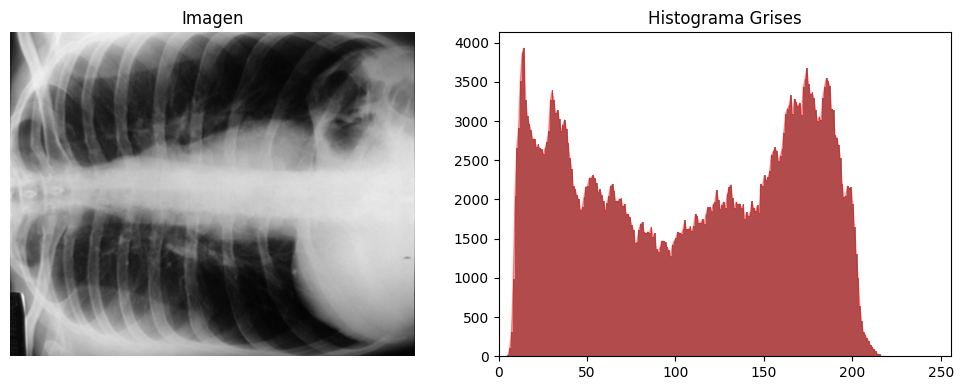

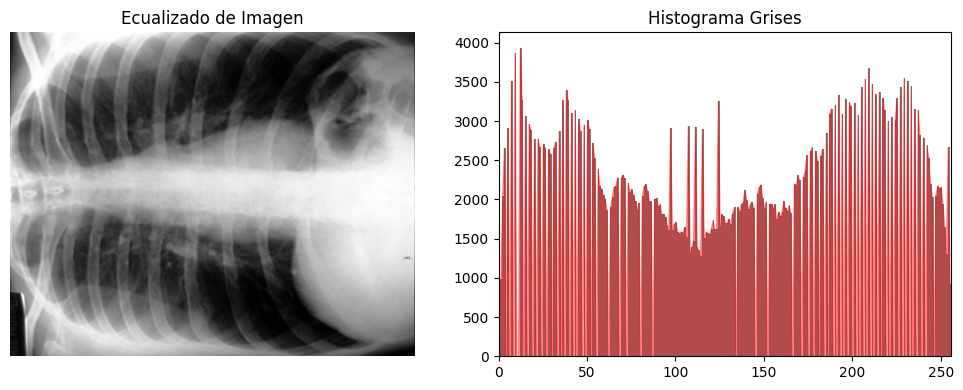

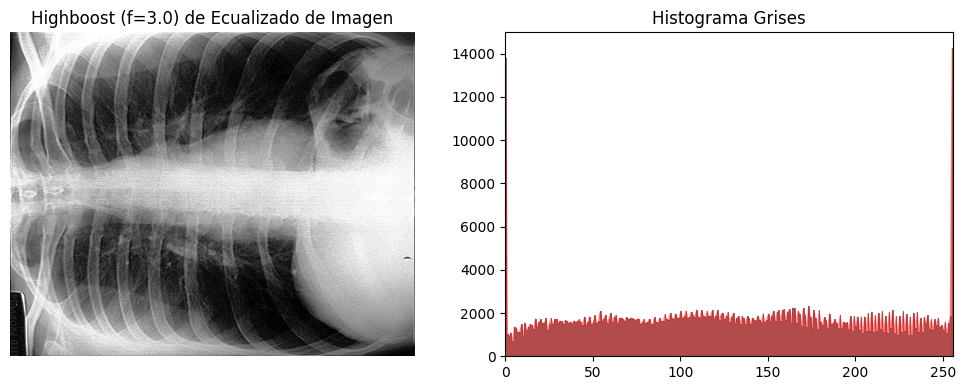

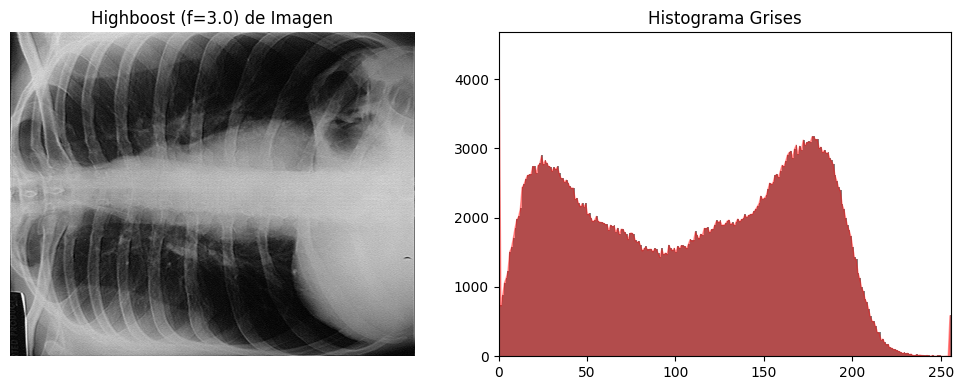

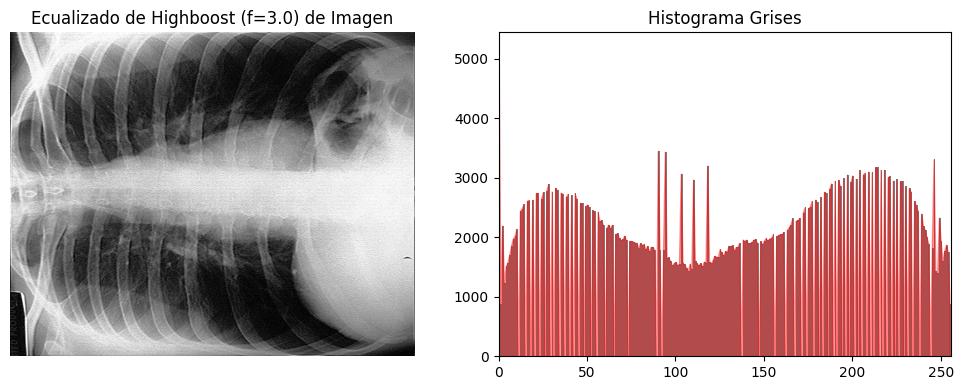

In [42]:
laplaciano = np.array([[0, 1, 0],
                      [1, -4, 1],
                      [0, 1, 0]], dtype=np.float32)
imagen = ProcesamientoImagen(cargar_imagen('toraxP.bmp'), es_color=False)
imagen.show_jupyter(histograma=True)
imagen_contraste = imagen.ecualizar()
imagen_contraste.show_jupyter(histograma=True)
#imagen_contraste.highboost(laplaciano, factor=1.0).show_jupyter()
#imagen_contraste.highboost(laplaciano, factor=2.0).show_jupyter()
imagen_contraste.highboost(laplaciano, factor=3.0).show_jupyter().trace()
#imagen_contraste.highboost(laplaciano, factor=4.0).show_jupyter()

imagen_highboost = imagen.highboost(laplaciano, factor=3.0)
imagen_highboost.show_jupyter(histograma=True)
imagen_highboost.ecualizar().show_jupyter(histograma=True).trace()

# Ejercicio 5
5.	Elija una fotografía para aplicar la técnica de detección de bordes. El resultado del procesamiento debe parecer el trazado en blanco y negro del perfil de los objetos.

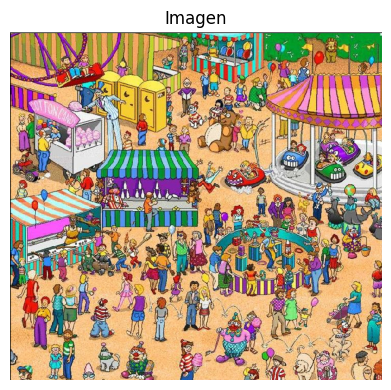

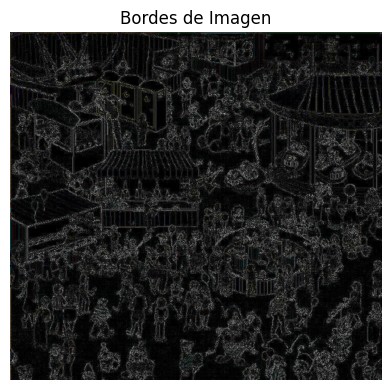

In [47]:
imagen = ProcesamientoImagen(cargar_imagen('waldo.bmp'), es_color=True)
imagen.show_jupyter(histograma=False)
imagen.mostrar_bordes(laplaciano).show_jupyter(histograma=False)

# Ejercicio 6
6.	En la carpeta FIBRA hay múltiples imágenes de una fibra óptica dopada con Erbio cuyo núcleo brilla en color verde cuando se bombea con un diodo láser de 1500 nm.  Estas imágenes fueron tomadas en condiciones de baja iluminación y con una cámara que era particularmente ruidosa.  Realice la resta entre dos imágenes consecutivas para evaluar el ruido.  Puede usar el histograma para revisar si el ruido tiene una distribución normal.

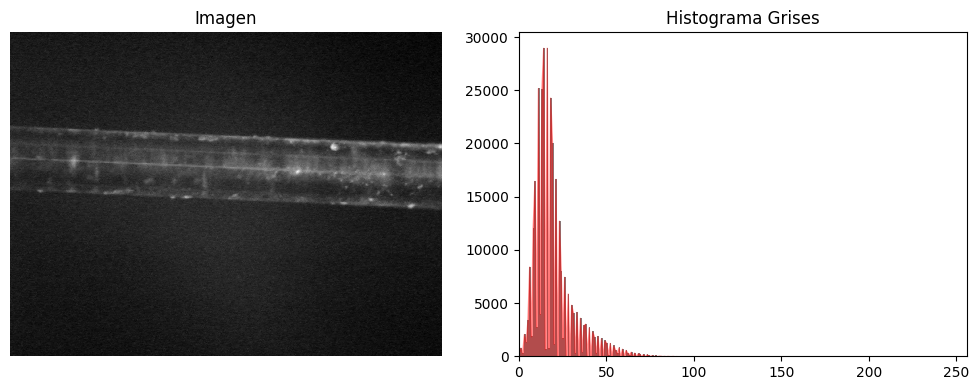

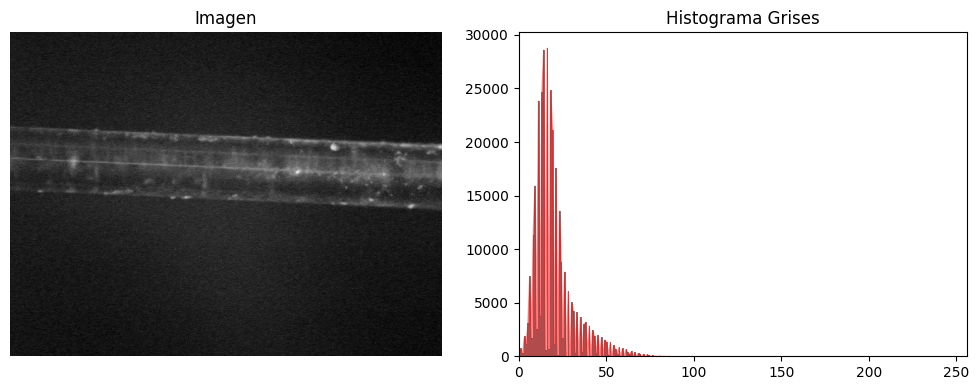

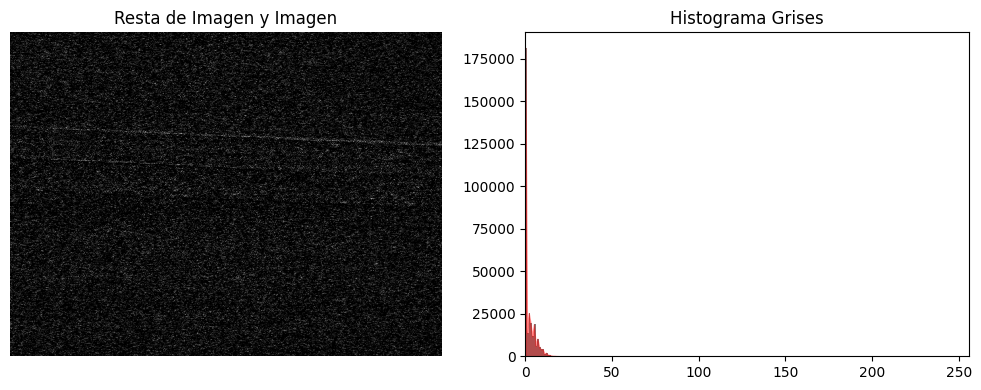

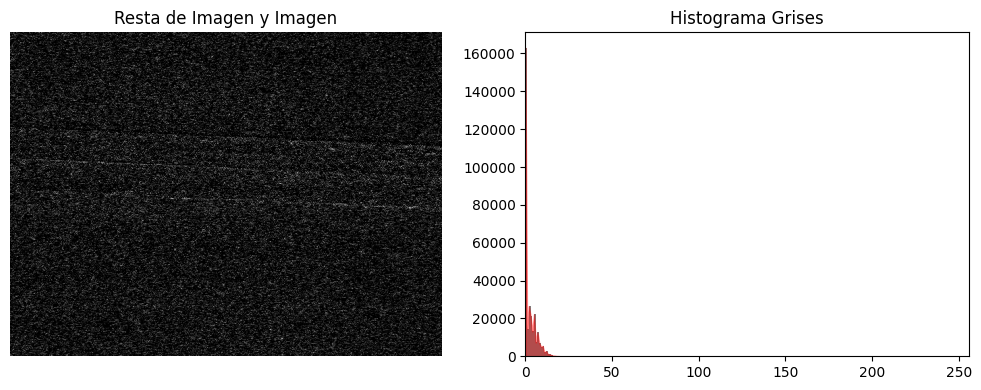

In [58]:
ruta_patrones = pathlib.Path.cwd() / "imagenes" / "fibra"
imagen1 = ProcesamientoImagen(ruta_patrones / "fibra3 (2).bmp", es_color=False)
imagen2 = ProcesamientoImagen(ruta_patrones / "fibra3 (3).bmp", es_color=False)
imagen1.show_jupyter(histograma=True)
imagen2.show_jupyter(histograma=True)
imagen1.restar_imagenes(imagen2).show_jupyter(histograma=True)
imagen2.restar_imagenes(imagen1).show_jupyter(histograma=True)

# Ejercicio 7
7.	Otra forma de reducir el ruido sin atenuar las altas frecuencias es promediar imágenes consecutivas.  Esta técnica se usa frecuentemente en Astronomía. Promedie 11 imágenes consecutivas de la fibra y compare el resultado con la imagen original.   ¿Puede apreciar la reducción del ruido?

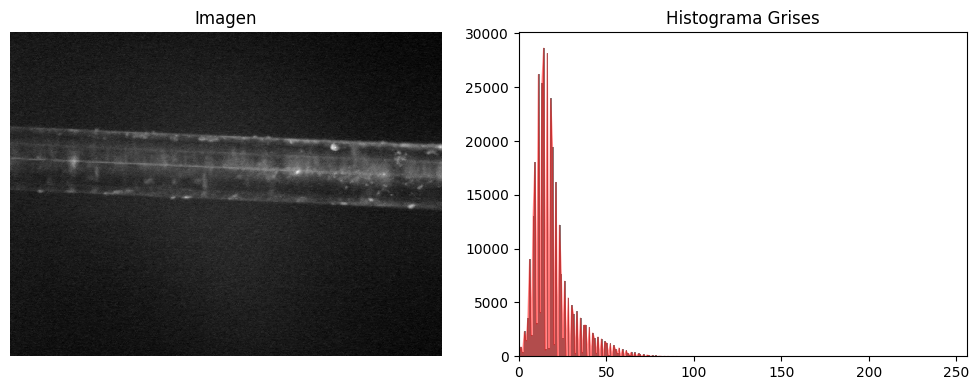

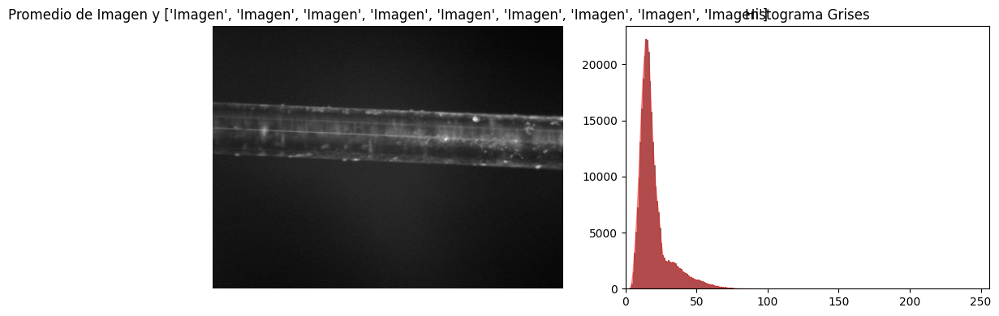

In [65]:
ruta_patrones = pathlib.Path.cwd() / "imagenes" / "fibra"
imagenes = ProcesamientoImagen(ruta_patrones / "fibra3 (1).bmp", es_color=False)
imagenes2 = [ProcesamientoImagen(ruta_patrones / f"fibra3 ({i}).bmp", es_color=False) for i in range(2, 11)]
imagenes.show_jupyter(histograma=True)
imagenes.promedio_imagenes(imagenes2).show_jupyter(histograma=True)